In [48]:
import tensorflow as tf

import networkx as nx
from networkx.drawing.nx_pydot import write_dot
import matplotlib.pyplot as plt
from IPython.display import SVG
from sklearn.tree import export_graphviz
tf.debugging.set_log_device_placement(True)

In [2]:
from __future__ import absolute_import, division, print_function, unicode_literals

import tensorflow as tf

from tensorflow.keras import layers
from sklearn import datasets
import pandas as pd
import numpy as np
print(tf.__version__)

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)


print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))



2.0.0
Num GPUs Available:  2


In [3]:

import matplotlib.pyplot as plt # For making plots

import seaborn as sns # Makes beautiful plots
from sklearn.preprocessing import StandardScaler # Testing sklearn
import tensorflow # Imports tensorflow
import keras # Imports keras

Using TensorFlow backend.


In [4]:
from tensorflow.python.platform import build_info as tf_build_info
print(tf_build_info.cuda_version_number)
# 9.0 in v1.10.0
print(tf_build_info.cudnn_version_number)
# 7 in v1.10.0

10.0
7.6


In [5]:
from tensorflow.python.client import device_lib

device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 6488868058793115839, name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 6614766059
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 5578515165001920802
 physical_device_desc: "device: 0, name: GeForce RTX 2070, pci bus id: 0000:17:00.0, compute capability: 7.5", name: "/device:GPU:1"
 device_type: "GPU"
 memory_limit: 6614766059
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 655690231564541122
 physical_device_desc: "device: 1, name: GeForce RTX 2070, pci bus id: 0000:65:00.0, compute capability: 7.5"]

In [6]:
import matplotlib.pyplot as plt
%matplotlib inline

In [7]:
import datetime, os

In [8]:
from tensorflow.keras.callbacks import TensorBoard

log_dir = 'logs'
tb = TensorBoard(log_dir=log_dir, histogram_freq=1)

In [9]:
from sklearn.model_selection import train_test_split

In [10]:
from keras.layers import Dense, Activation,Conv2D,MaxPooling2D,Flatten,Dropout

## Case Study 12

In [11]:
df = pd.read_csv('HIGGS.csv',header = None)

In [152]:
# Verify size is as expected
print("{:>25}{:>10,} x {:,}\n".format("Shape of raw data is ", df.shape[0], df.shape[1]))

    Shape of raw data is    100,000 x 29



In [153]:
df.head()

,label,lepton pT,lepton eta,lepton phi,missing energy magnitude,missing energy phi,jet 1 pt,jet 1 eta,jet 1 phi,jet 1 b-tag,...,jet 4 eta,jet 4 phi,jet 4 b-tag,m_jj,m_jjj,m_lv,m_jlv,m_bb,m_wbb,m_wwbb
0,1.0,0.907542,0.329147,0.359412,1.497970,-0.313010,1.095531,-0.557525,-1.588230,2.173076,...,-1.138930,-0.000819,0.000000,0.302220,0.833048,0.985700,0.978098,0.779732,0.992356,0.798343
1,1.0,0.798835,1.470639,-1.635975,0.453773,0.425629,1.104875,1.282322,1.381664,0.000000,...,1.128848,0.900461,0.000000,0.909753,1.108330,0.985692,0.951331,0.803252,0.865924,0.780118
2,0.0,1.344385,-0.876626,0.935913,1.992050,0.882454,1.786066,-1.646778,-0.942383,0.000000,...,-0.678379,-1.360356,0.000000,0.946652,1.028704,0.998656,0.728281,0.869200,1.026736,0.957904
3,1.0,1.105009,0.321356,1.522401,0.882808,-1.205349,0.681466,-1.070464,-0.921871,0.000000,...,-0.373566,0.113041,0.000000,0.755856,1.361057,0.986610,0.838085,1.133295,0.872245,0.808487
4,0.0,1.595839,-0.607811,0.007075,1.818450,-0.111906,0.847550,-0.566437,1.581239,2.173076,...,-0.654227,-1.274345,3.101961,0.823761,0.938191,0.971758,0.789176,0.430553,0.961357,0.957818


In [154]:
df[0].describe()

KeyError: 0

In [155]:
x1 = df.drop([0], axis = 1)

KeyError: '[0] not found in axis'

In [16]:
x1.head()

,1,2,3,4,5,6,7,8,9,10,...,19,20,21,22,23,24,25,26,27,28
0,0.869293,-0.635082,0.225690,0.327470,-0.689993,0.754202,-0.248573,-1.092064,0.000000,1.374992,...,-0.010455,-0.045767,3.101961,1.353760,0.979563,0.978076,0.920005,0.721657,0.988751,0.876678
1,0.907542,0.329147,0.359412,1.497970,-0.313010,1.095531,-0.557525,-1.588230,2.173076,0.812581,...,-1.138930,-0.000819,0.000000,0.302220,0.833048,0.985700,0.978098,0.779732,0.992356,0.798343
2,0.798835,1.470639,-1.635975,0.453773,0.425629,1.104875,1.282322,1.381664,0.000000,0.851737,...,1.128848,0.900461,0.000000,0.909753,1.108330,0.985692,0.951331,0.803252,0.865924,0.780118
3,1.344385,-0.876626,0.935913,1.992050,0.882454,1.786066,-1.646778,-0.942383,0.000000,2.423265,...,-0.678379,-1.360356,0.000000,0.946652,1.028704,0.998656,0.728281,0.869200,1.026736,0.957904
4,1.105009,0.321356,1.522401,0.882808,-1.205349,0.681466,-1.070464,-0.921871,0.000000,0.800872,...,-0.373566,0.113041,0.000000,0.755856,1.361057,0.986610,0.838085,1.133295,0.872245,0.808487


In [17]:
for col in x1.columns: 
    print(col) 

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28


In [18]:
y = df[0]

In [19]:
y = y.to_numpy()

In [20]:
y[1:20]

array([1., 1., 0., 1., 0., 1., 1., 1., 1., 1., 0., 1., 1., 1., 0., 1., 0.,
       0., 1.])

In [21]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler(feature_range=(0,1))
scaled_train = scaler.fit_transform(x1)

# Print out the adjustment that the scaler applied to the lepton pT column of data
#print("Note: median values were scaled by multiplying by {:.10f} and adding {:.6f}".format(scaler.scale_[0],scaler.min_[0]))
#multiplied_by = scaler.scale_[0]
#added = scaler.min_[0]

scaled_train_df = pd.DataFrame(scaled_train, columns = x1.columns.values)

In [22]:
import matplotlib.pyplot as plt
%matplotlib inline

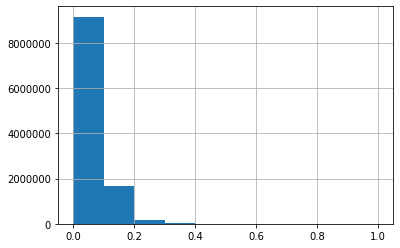

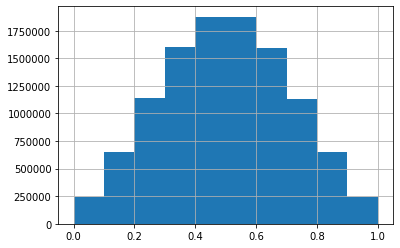

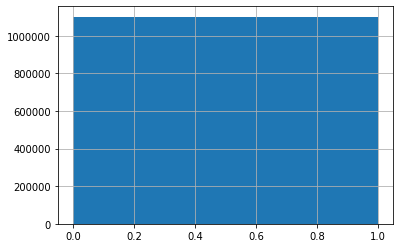

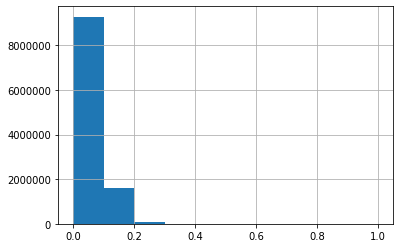

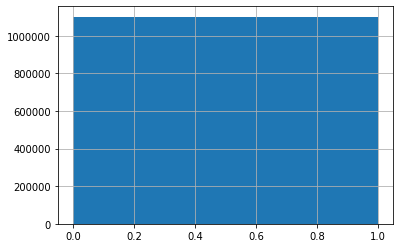

...

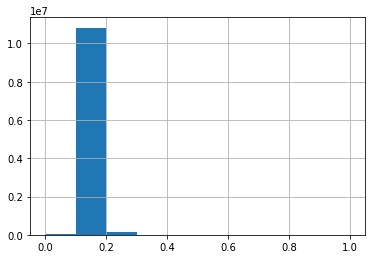

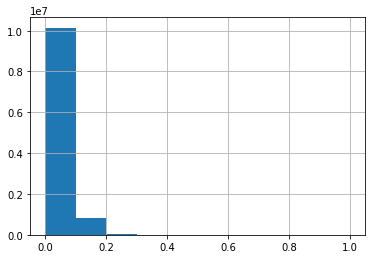

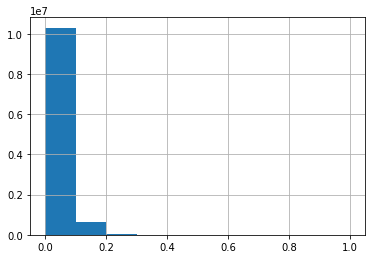

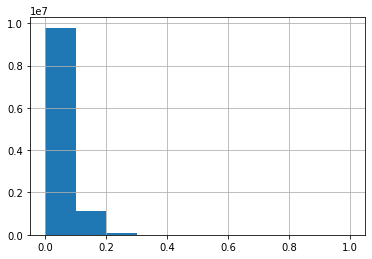

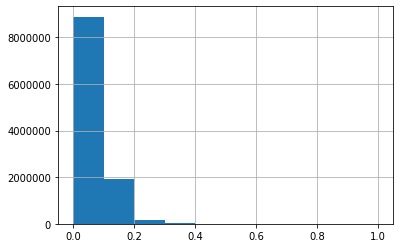

In [23]:
for i in scaled_train_df:
    scaled_train_df[i].hist()
    plt.show()

In [24]:
from keras.applications import Xception
from keras.utils import multi_gpu_model

In [25]:
mirrored_strategy = tf.distribute.MirroredStrategy(devices=["/gpu:0", "/gpu:1"],
                                          cross_device_ops=tf.distribute.HierarchicalCopyAllReduce())

In [124]:

with mirrored_strategy.scope():
    model_higgs = tf.keras.Sequential()
    model_higgs.add(layers.Dense(300, input_dim = 28, activation = 'tanh'))
    model_higgs.add(layers.Dense(300, activation = 'tanh'))
    model_higgs.add(layers.Dense(300, activation = 'tanh'))
    model_higgs.add(layers.Dense(300, activation = 'tanh'))
    model_higgs.add(layers.Dense(300, activation = 'tanh'))
    model_higgs.add(layers.Dense(2, activation = 'sigmoid'))
    
    model_higgs.compile(optimizer=tf.optimizers.SGD(learning_rate = 0.1, decay = 0.00001),
             loss=tf.keras.losses.SparseCategoricalCrossentropy(),
             metrics=['accuracy'])
    
    log_dir = 'higgs_logs'
    tb_higgs = TensorBoard(log_dir=log_dir, histogram_freq=1)

In [125]:
print(model_higgs.summary())

Model: "sequential_45"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_239 (Dense)            (None, 300)               8700      
_________________________________________________________________
dense_240 (Dense)            (None, 300)               90300     
_________________________________________________________________
dense_241 (Dense)            (None, 300)               90300     
_________________________________________________________________
dense_242 (Dense)            (None, 300)               90300     
_________________________________________________________________
dense_243 (Dense)            (None, 300)               90300     
_________________________________________________________________
dense_244 (Dense)            (None, 2)                 602       
Total params: 370,502
Trainable params: 370,502
Non-trainable params: 0
_______________________________________________

In [126]:
x1.shape

(11000000, 28)

In [127]:
with mirrored_strategy.scope():

    x_train, x_test, y_train, y_test = train_test_split(x1, y, test_size=0.20, random_state=102)

In [151]:
with mirrored_strategy.scope():

    history = model_higgs.fit(x_train.values, y_train, validation_data=(x_test.values, y_test), epochs=300, batch_size=50000, callbacks=[tb_higgs])

ValueError: Failed to find data adapter that can handle input: <class 'numpy.ndarray'>, <class 'pandas.core.frame.DataFrame'>

In [129]:
with mirrored_strategy.scope():
    predictions = model_higgs.predict(x_test.values)

Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op __inference_distributed_function_890844 in device /job:localhost/replica:0/task:0/device:GPU:0


In [130]:
print("Prediction: {}".format(tf.argmax(predictions, axis=1)))
print("   Actuals: {}".format(y_test))


Prediction: [0 1 0 ... 0 1 1]
   Actuals: [0. 1. 0. ... 0. 1. 0.]


In [131]:
test_accuracy = tf.keras.metrics.Accuracy()

In [132]:
test_accuracy(tf.argmax(predictions, axis=1), y_test)
print("Test set accuracy: {:.3%}".format(test_accuracy.result()))


Test set accuracy: 69.222%


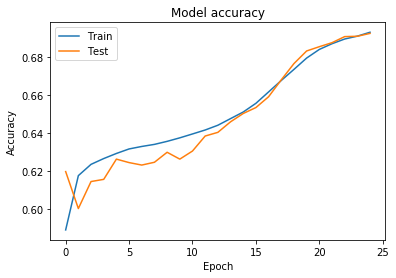

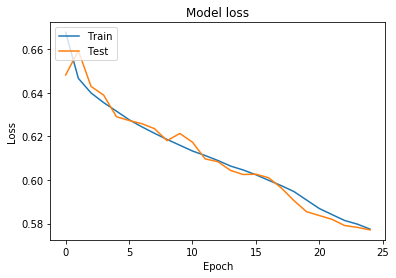

In [133]:
# Plot training & validation accuracy values
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [134]:
#time for some hyperparams

In [136]:
# Load the TensorBoard notebook extension
%reload_ext tensorboard

In [137]:
import pandas as pd
df = pd.read_csv("HIGGS.csv",nrows=100000)
df.columns=['label','lepton pT', 'lepton eta', 'lepton phi', 'missing energy magnitude', 'missing energy phi', 'jet 1 pt',
             'jet 1 eta', 'jet 1 phi', 'jet 1 b-tag', 'jet 2 pt', 'jet 2 eta', 'jet 2 phi', 'jet 2 b-tag', 'jet 3 pt',
             'jet 3 eta', 'jet 3 phi', 'jet 3 b-tag', 'jet 4 pt', 'jet 4 eta', 'jet 4 phi', 'jet 4 b-tag', 'm_jj',
             'm_jjj', 'm_lv','m_jlv', 'm_bb', 'm_wbb', 'm_wwbb']
from sklearn.model_selection import train_test_split

In [138]:
import tensorflow as tf
from tensorboard.plugins.hparams import api as hp
from tensorflow import feature_column
from tensorflow.keras import layers
import tensorflow.compat.v2.feature_column as fc
 
print("GPU Available: ", tf.test.is_gpu_available())
 
 

 
x_train, x_test, y_train, y_test = train_test_split(df.iloc[:,1:],df.iloc[:,0:1], test_size=0.20, random_state=102)
 
#Estimators are a pain

GPU Available:  True


In [139]:
import tensorflow as tf
from tensorboard.plugins.hparams import api as hp

In [140]:
HP_NUM_UNITS = hp.HParam('num_units', hp.Discrete([100, 200, 300, 500]))
HP_DROPOUT = hp.HParam('dropout', hp.RealInterval(0.1, 0.5))
HP_OPTIMIZER = hp.HParam('optimizer', hp.Discrete(['adam', 'sgd']))


In [141]:
METRIC_ACCURACY = 'Accuracy'

with tf.summary.create_file_writer('logs/hparam_tuning').as_default():
  hp.hparams_config(
    hparams=[HP_NUM_UNITS, HP_DROPOUT, HP_OPTIMIZER],
    metrics=[hp.Metric(METRIC_ACCURACY, display_name='Accuracy')],
  )

In [142]:
# The only trick here is the fit expects matrices, not dataframes.
# so just use .values
# also change from 10 classes to 2
# also change loss function
def train_test_model(hparams):
  model = tf.keras.models.Sequential([
    tf.keras.layers.Dense(hparams[HP_NUM_UNITS], activation=tf.nn.relu),
    tf.keras.layers.Dropout(hparams[HP_DROPOUT]),
    tf.keras.layers.Dense(hparams[HP_NUM_UNITS], activation=tf.nn.relu),
    tf.keras.layers.Dense(hparams[HP_NUM_UNITS], activation=tf.nn.relu),
    tf.keras.layers.Dense(hparams[HP_NUM_UNITS], activation=tf.nn.relu),
    tf.keras.layers.Dense(hparams[HP_NUM_UNITS], activation=tf.nn.relu),  
    tf.keras.layers.Dense(2, activation=tf.nn.sigmoid),
  ])
  model.compile(
      optimizer=hparams[HP_OPTIMIZER],
      loss=tf.keras.losses.SparseCategoricalCrossentropy(),
      metrics=['accuracy'],
  )

  model.fit(x_train.values, y_train.values, epochs=200, batch_size=50000) 
  _, accuracy = model.evaluate(x_test.values, y_test.values)
  return accuracy

In [143]:
def run(run_dir, hparams):
  with tf.summary.create_file_writer(run_dir).as_default():
    hp.hparams(hparams)  # record the values used in this trial
    accuracy = train_test_model(hparams)
    tf.summary.scalar(METRIC_ACCURACY, accuracy, step=1)

In [144]:
"""
history = model.fit(
    ...,
    callbacks=[
        tf.keras.callbacks.TensorBoard(logdir),  # log metrics
        hp.KerasCallback(logdir, hparams),  # log hparams
    ],
)

"""

'\nhistory = model.fit(\n    ...,\n    callbacks=[\n        tf.keras.callbacks.TensorBoard(logdir),  # log metrics\n        hp.KerasCallback(logdir, hparams),  # log hparams\n    ],\n)\n\n'

In [145]:
with mirrored_strategy.scope():

    session_num = 0

    for num_units in HP_NUM_UNITS.domain.values:
      for dropout_rate in (HP_DROPOUT.domain.min_value, HP_DROPOUT.domain.max_value):
        for optimizer in HP_OPTIMIZER.domain.values:
          hparams = {
              HP_NUM_UNITS: num_units,
              HP_DROPOUT: dropout_rate,
              HP_OPTIMIZER: optimizer,
          }
          run_name = "run-%d" % session_num
          print('--- Starting trial: %s' % run_name)
          print({h.name: hparams[h] for h in hparams})
          run('logs/hparam_tuning/' + run_name, hparams)
          session_num += 1

--- Starting trial: run-0
{'num_units': 100, 'dropout': 0.1, 'optimizer': 'adam'}
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RebatchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AutoShardDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 1/200
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MultiDeviceIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:loca

80000/80000 [==============================] - 0s 1us/sample - loss: 0.6517 - accuracy: 0.6130
Epoch 20/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6507 - accuracy: 0.6135
Epoch 21/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6490 - accuracy: 0.6155
Epoch 22/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6472 - accuracy: 0.6192
Epoch 23/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6459 - accuracy: 0.6192
Epoch 24/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6448 - accuracy: 0.6221
Epoch 25/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6434 - accuracy: 0.6249
Epoch 26/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6428 - accuracy: 0.6228
Epoch 27/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6407 - accuracy: 0.6265
Epoch 28/200
80000/80000 [===============

Epoch 95/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5854 - accuracy: 0.6857
Epoch 96/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5843 - accuracy: 0.6874
Epoch 97/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5851 - accuracy: 0.6863
Epoch 98/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5836 - accuracy: 0.6874
Epoch 99/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5825 - accuracy: 0.6881
Epoch 100/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5816 - accuracy: 0.6899
Epoch 101/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5813 - accuracy: 0.6907
Epoch 102/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5813 - accuracy: 0.6896
Epoch 103/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5796 - accuracy: 0.6931
Epoch 104/200
80000/8000

80000/80000 [==============================] - 0s 1us/sample - loss: 0.5475 - accuracy: 0.7171
Epoch 171/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5483 - accuracy: 0.7173
Epoch 172/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5470 - accuracy: 0.7190
Epoch 173/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5474 - accuracy: 0.7169
Epoch 174/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5472 - accuracy: 0.7182
Epoch 175/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5468 - accuracy: 0.7186
Epoch 176/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5466 - accuracy: 0.7186
Epoch 177/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5452 - accuracy: 0.7187
Epoch 178/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5449 - accuracy: 0.7184
Epoch 179/200
80000/80000 [======

--- Starting trial: run-1
{'num_units': 100, 'dropout': 0.1, 'optimizer': 'sgd'}
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 1/200
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:

Epoch 63/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6916 - accuracy: 0.5281
Epoch 64/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6916 - accuracy: 0.5297
Epoch 65/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6915 - accuracy: 0.5297
Epoch 66/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6916 - accuracy: 0.5281
Epoch 67/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6917 - accuracy: 0.5283
Epoch 68/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6916 - accuracy: 0.5288
Epoch 69/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6915 - accuracy: 0.5282
Epoch 70/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6916 - accuracy: 0.5277
Epoch 71/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6915 - accuracy: 0.5292
Epoch 72/200
80000/80000 [==

80000/80000 [==============================] - 0s 1us/sample - loss: 0.6905 - accuracy: 0.5327
Epoch 139/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6906 - accuracy: 0.5329
Epoch 140/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6907 - accuracy: 0.5325
Epoch 141/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6905 - accuracy: 0.5339
Epoch 142/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6905 - accuracy: 0.5330
Epoch 143/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6905 - accuracy: 0.5339
Epoch 144/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6905 - accuracy: 0.5332
Epoch 145/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6905 - accuracy: 0.5324
Epoch 146/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6903 - accuracy: 0.5339
Epoch 147/200
80000/80000 [======

--- Starting trial: run-2
{'num_units': 100, 'dropout': 0.5, 'optimizer': 'adam'}
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 1/200
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task

80000/80000 [==============================] - 0s 1us/sample - loss: 0.6643 - accuracy: 0.5926
Epoch 28/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6641 - accuracy: 0.5920
Epoch 29/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6636 - accuracy: 0.5935
Epoch 30/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6613 - accuracy: 0.5971
Epoch 31/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6605 - accuracy: 0.5984
Epoch 32/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6595 - accuracy: 0.5998
Epoch 33/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6587 - accuracy: 0.6016
Epoch 34/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6587 - accuracy: 0.6021
Epoch 35/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6574 - accuracy: 0.6036
Epoch 36/200
80000/80000 [===============

80000/80000 [==============================] - 0s 1us/sample - loss: 0.6109 - accuracy: 0.6621
Epoch 103/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6123 - accuracy: 0.6613
Epoch 104/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6104 - accuracy: 0.6628
Epoch 105/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6105 - accuracy: 0.6645
Epoch 106/200
80000/80000 [==============================] - 0s 2us/sample - loss: 0.6095 - accuracy: 0.6664
Epoch 107/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6087 - accuracy: 0.6649
Epoch 108/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6083 - accuracy: 0.6647
Epoch 109/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6070 - accuracy: 0.6670
Epoch 110/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6071 - accuracy: 0.6676
Epoch 111/200
80000/80000 [======

80000/80000 [==============================] - 0s 1us/sample - loss: 0.5843 - accuracy: 0.6869
Epoch 177/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5826 - accuracy: 0.6890
Epoch 178/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5834 - accuracy: 0.6886
Epoch 179/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5833 - accuracy: 0.6883
Epoch 180/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5827 - accuracy: 0.6903
Epoch 181/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5846 - accuracy: 0.6883
Epoch 182/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5830 - accuracy: 0.6891
Epoch 183/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5825 - accuracy: 0.6883
Epoch 184/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5822 - accuracy: 0.6897
Epoch 185/200
80000/80000 [======

--- Starting trial: run-3
{'num_units': 100, 'dropout': 0.5, 'optimizer': 'sgd'}
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 1/200
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:

80000/80000 [==============================] - 0s 1us/sample - loss: 0.6921 - accuracy: 0.5269
Epoch 64/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6919 - accuracy: 0.5258
Epoch 65/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6920 - accuracy: 0.5248
Epoch 66/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6922 - accuracy: 0.5254
Epoch 67/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6922 - accuracy: 0.5250
Epoch 68/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6920 - accuracy: 0.5260
Epoch 69/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6922 - accuracy: 0.5241
Epoch 70/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6919 - accuracy: 0.5258
Epoch 71/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6920 - accuracy: 0.5266
Epoch 72/200
80000/80000 [===============

80000/80000 [==============================] - 0s 1us/sample - loss: 0.6920 - accuracy: 0.5270
Epoch 139/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6918 - accuracy: 0.5276
Epoch 140/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6919 - accuracy: 0.5268
Epoch 141/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6918 - accuracy: 0.5276
Epoch 142/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6920 - accuracy: 0.5269
Epoch 143/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6919 - accuracy: 0.5268
Epoch 144/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6919 - accuracy: 0.5260
Epoch 145/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6917 - accuracy: 0.5280
Epoch 146/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6919 - accuracy: 0.5262
Epoch 147/200
80000/80000 [======

--- Starting trial: run-4
{'num_units': 200, 'dropout': 0.1, 'optimizer': 'adam'}
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 1/200
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task

80000/80000 [==============================] - 0s 1us/sample - loss: 0.6243 - accuracy: 0.6473
Epoch 28/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6222 - accuracy: 0.6507
Epoch 29/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6214 - accuracy: 0.6493
Epoch 30/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6192 - accuracy: 0.6524
Epoch 31/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6171 - accuracy: 0.6540
Epoch 32/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6172 - accuracy: 0.6561
Epoch 33/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6168 - accuracy: 0.6563
Epoch 34/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6145 - accuracy: 0.6572
Epoch 35/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6128 - accuracy: 0.6585
Epoch 36/200
80000/80000 [===============

Epoch 103/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5477 - accuracy: 0.7175
Epoch 104/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5469 - accuracy: 0.7178
Epoch 105/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5445 - accuracy: 0.7194
Epoch 106/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5459 - accuracy: 0.7193
Epoch 107/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5505 - accuracy: 0.7136
Epoch 108/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5544 - accuracy: 0.7122
Epoch 109/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5447 - accuracy: 0.7206
Epoch 110/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5480 - accuracy: 0.7172
Epoch 111/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5436 - accuracy: 0.7201
Epoch 112/200
80000

80000/80000 [==============================] - 0s 1us/sample - loss: 0.5445 - accuracy: 0.7215
Epoch 179/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5079 - accuracy: 0.7473
Epoch 180/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5006 - accuracy: 0.7537
Epoch 181/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5010 - accuracy: 0.7518
Epoch 182/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.4998 - accuracy: 0.7534
Epoch 183/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.4975 - accuracy: 0.7552
Epoch 184/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.4969 - accuracy: 0.7544
Epoch 185/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.4982 - accuracy: 0.7537
Epoch 186/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.4977 - accuracy: 0.7544
Epoch 187/200
80000/80000 [======

--- Starting trial: run-5
{'num_units': 200, 'dropout': 0.1, 'optimizer': 'sgd'}
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 1/200
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:

80000/80000 [==============================] - 0s 1us/sample - loss: 0.6922 - accuracy: 0.5247
Epoch 65/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6921 - accuracy: 0.5250
Epoch 66/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6922 - accuracy: 0.5239
Epoch 67/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6922 - accuracy: 0.5257
Epoch 68/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6921 - accuracy: 0.5256
Epoch 69/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6922 - accuracy: 0.5258
Epoch 70/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6921 - accuracy: 0.5260
Epoch 71/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6921 - accuracy: 0.5265
Epoch 72/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6921 - accuracy: 0.5265
Epoch 73/200
80000/80000 [===============

80000/80000 [==============================] - 0s 1us/sample - loss: 0.6914 - accuracy: 0.5280
Epoch 140/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6915 - accuracy: 0.5287
Epoch 141/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6914 - accuracy: 0.5291
Epoch 142/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6915 - accuracy: 0.5288
Epoch 143/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6914 - accuracy: 0.5292
Epoch 144/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6914 - accuracy: 0.5289
Epoch 145/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6913 - accuracy: 0.5293
Epoch 146/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6914 - accuracy: 0.5291
Epoch 147/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6914 - accuracy: 0.5287
Epoch 148/200
80000/80000 [======

--- Starting trial: run-6
{'num_units': 200, 'dropout': 0.5, 'optimizer': 'adam'}
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 1/200
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task

80000/80000 [==============================] - 0s 1us/sample - loss: 0.6504 - accuracy: 0.6128
Epoch 28/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6495 - accuracy: 0.6159
Epoch 29/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6471 - accuracy: 0.6163
Epoch 30/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6460 - accuracy: 0.6189
Epoch 31/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6452 - accuracy: 0.6218
Epoch 32/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6441 - accuracy: 0.6219
Epoch 33/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6439 - accuracy: 0.6233
Epoch 34/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6434 - accuracy: 0.6219
Epoch 35/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6415 - accuracy: 0.6266
Epoch 36/200
80000/80000 [===============

Epoch 103/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5860 - accuracy: 0.6849
Epoch 104/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5865 - accuracy: 0.6877
Epoch 105/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5856 - accuracy: 0.6867
Epoch 106/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5847 - accuracy: 0.6880
Epoch 107/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5838 - accuracy: 0.6883
Epoch 108/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5832 - accuracy: 0.6888
Epoch 109/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5831 - accuracy: 0.6892
Epoch 110/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5825 - accuracy: 0.6882
Epoch 111/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5810 - accuracy: 0.6904
Epoch 112/200
80000

80000/80000 [==============================] - 0s 1us/sample - loss: 0.5565 - accuracy: 0.7106
Epoch 179/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5574 - accuracy: 0.7107
Epoch 180/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5555 - accuracy: 0.7101
Epoch 181/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5589 - accuracy: 0.7088
Epoch 182/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5561 - accuracy: 0.7121
Epoch 183/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5561 - accuracy: 0.7122
Epoch 184/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5560 - accuracy: 0.7110
Epoch 185/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5578 - accuracy: 0.7098
Epoch 186/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5552 - accuracy: 0.7127
Epoch 187/200
80000/80000 [======

--- Starting trial: run-7
{'num_units': 200, 'dropout': 0.5, 'optimizer': 'sgd'}
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 1/200
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:

80000/80000 [==============================] - 0s 1us/sample - loss: 0.6927 - accuracy: 0.5202
Epoch 65/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6928 - accuracy: 0.5203
Epoch 66/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6929 - accuracy: 0.5202
Epoch 67/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6926 - accuracy: 0.5221
Epoch 68/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6927 - accuracy: 0.5217
Epoch 69/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6926 - accuracy: 0.5212
Epoch 70/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6927 - accuracy: 0.5222
Epoch 71/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6928 - accuracy: 0.5213
Epoch 72/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6927 - accuracy: 0.5202
Epoch 73/200
80000/80000 [===============

80000/80000 [==============================] - 0s 1us/sample - loss: 0.6923 - accuracy: 0.5256
Epoch 140/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6922 - accuracy: 0.5259
Epoch 141/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6923 - accuracy: 0.5264
Epoch 142/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6923 - accuracy: 0.5254
Epoch 143/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6924 - accuracy: 0.5259
Epoch 144/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6923 - accuracy: 0.5257
Epoch 145/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6922 - accuracy: 0.5260
Epoch 146/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6925 - accuracy: 0.5242
Epoch 147/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6924 - accuracy: 0.5249
Epoch 148/200
80000/80000 [======

--- Starting trial: run-8
{'num_units': 300, 'dropout': 0.1, 'optimizer': 'adam'}
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 1/200
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task

80000/80000 [==============================] - 0s 1us/sample - loss: 0.6289 - accuracy: 0.6417
Epoch 28/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6215 - accuracy: 0.6513
Epoch 29/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6195 - accuracy: 0.6528
Epoch 30/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6183 - accuracy: 0.6533
Epoch 31/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6169 - accuracy: 0.6555
Epoch 32/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6135 - accuracy: 0.6588
Epoch 33/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6121 - accuracy: 0.6595
Epoch 34/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6104 - accuracy: 0.6642
Epoch 35/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6091 - accuracy: 0.6628
Epoch 36/200
80000/80000 [===============

Epoch 103/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5304 - accuracy: 0.7284
Epoch 104/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5287 - accuracy: 0.7314
Epoch 105/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5280 - accuracy: 0.7323
Epoch 106/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5265 - accuracy: 0.7334
Epoch 107/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5305 - accuracy: 0.7313
Epoch 108/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5368 - accuracy: 0.7248
Epoch 109/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5232 - accuracy: 0.7345
Epoch 110/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5280 - accuracy: 0.7325
Epoch 111/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5210 - accuracy: 0.7371
Epoch 112/200
80000

80000/80000 [==============================] - 0s 1us/sample - loss: 0.6229 - accuracy: 0.6885
Epoch 179/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5107 - accuracy: 0.7398
Epoch 180/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5040 - accuracy: 0.7455
Epoch 181/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.4802 - accuracy: 0.7701
Epoch 182/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.4901 - accuracy: 0.7582
Epoch 183/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.4929 - accuracy: 0.7541
Epoch 184/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.4811 - accuracy: 0.7699
Epoch 185/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.4775 - accuracy: 0.7717
Epoch 186/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.4730 - accuracy: 0.7709
Epoch 187/200
80000/80000 [======

--- Starting trial: run-9
{'num_units': 300, 'dropout': 0.1, 'optimizer': 'sgd'}
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 1/200
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:

80000/80000 [==============================] - 0s 1us/sample - loss: 0.6923 - accuracy: 0.5265
Epoch 65/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6923 - accuracy: 0.5257
Epoch 66/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6923 - accuracy: 0.5256
Epoch 67/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6923 - accuracy: 0.5273
Epoch 68/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6923 - accuracy: 0.5271
Epoch 69/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6922 - accuracy: 0.5268
Epoch 70/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6923 - accuracy: 0.5268
Epoch 71/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6923 - accuracy: 0.5263
Epoch 72/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6922 - accuracy: 0.5271
Epoch 73/200
80000/80000 [===============

80000/80000 [==============================] - 0s 1us/sample - loss: 0.6917 - accuracy: 0.5286
Epoch 140/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6917 - accuracy: 0.5286
Epoch 141/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6918 - accuracy: 0.5290
Epoch 142/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6917 - accuracy: 0.5288
Epoch 143/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6918 - accuracy: 0.5286
Epoch 144/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6917 - accuracy: 0.5282
Epoch 145/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6916 - accuracy: 0.5281
Epoch 146/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6917 - accuracy: 0.5285
Epoch 147/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6917 - accuracy: 0.5284
Epoch 148/200
80000/80000 [======

--- Starting trial: run-10
{'num_units': 300, 'dropout': 0.5, 'optimizer': 'adam'}
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 1/200
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/tas

80000/80000 [==============================] - 0s 1us/sample - loss: 0.6480 - accuracy: 0.6164
Epoch 28/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6453 - accuracy: 0.6209
Epoch 29/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6459 - accuracy: 0.6195
Epoch 30/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6429 - accuracy: 0.6240
Epoch 31/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6423 - accuracy: 0.6251
Epoch 32/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6418 - accuracy: 0.6255
Epoch 33/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6391 - accuracy: 0.6285
Epoch 34/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6376 - accuracy: 0.6296
Epoch 35/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6360 - accuracy: 0.6316
Epoch 36/200
80000/80000 [===============

Epoch 103/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5732 - accuracy: 0.6961
Epoch 104/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5725 - accuracy: 0.6973
Epoch 105/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5717 - accuracy: 0.6978
Epoch 106/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5711 - accuracy: 0.6968
Epoch 107/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5709 - accuracy: 0.6976
Epoch 108/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5698 - accuracy: 0.6986
Epoch 109/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5700 - accuracy: 0.6990
Epoch 110/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5694 - accuracy: 0.6983
Epoch 111/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5672 - accuracy: 0.7003
Epoch 112/200
80000

80000/80000 [==============================] - 0s 1us/sample - loss: 0.5365 - accuracy: 0.7266
Epoch 179/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5403 - accuracy: 0.7221
Epoch 180/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5364 - accuracy: 0.7254
Epoch 181/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5375 - accuracy: 0.7243
Epoch 182/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5359 - accuracy: 0.7253
Epoch 183/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5361 - accuracy: 0.7269
Epoch 184/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5364 - accuracy: 0.7262
Epoch 185/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5344 - accuracy: 0.7267
Epoch 186/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5333 - accuracy: 0.7284
Epoch 187/200
80000/80000 [======

--- Starting trial: run-11
{'num_units': 300, 'dropout': 0.5, 'optimizer': 'sgd'}
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 1/200
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task

80000/80000 [==============================] - 0s 1us/sample - loss: 0.6919 - accuracy: 0.5282
Epoch 65/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6921 - accuracy: 0.5271
Epoch 66/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6920 - accuracy: 0.5274
Epoch 67/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6921 - accuracy: 0.5264
Epoch 68/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6921 - accuracy: 0.5280
Epoch 69/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6920 - accuracy: 0.5271
Epoch 70/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6920 - accuracy: 0.5270
Epoch 71/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6921 - accuracy: 0.5269
Epoch 72/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6921 - accuracy: 0.5261
Epoch 73/200
80000/80000 [===============

80000/80000 [==============================] - 0s 1us/sample - loss: 0.6918 - accuracy: 0.5285
Epoch 140/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6917 - accuracy: 0.5277
Epoch 141/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6916 - accuracy: 0.5296
Epoch 142/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6916 - accuracy: 0.5282
Epoch 143/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6915 - accuracy: 0.5292
Epoch 144/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6916 - accuracy: 0.5285
Epoch 145/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6916 - accuracy: 0.5287
Epoch 146/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6915 - accuracy: 0.5288
Epoch 147/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6918 - accuracy: 0.5275
Epoch 148/200
80000/80000 [======

--- Starting trial: run-12
{'num_units': 500, 'dropout': 0.1, 'optimizer': 'adam'}
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 1/200
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/tas

80000/80000 [==============================] - 0s 1us/sample - loss: 0.6211 - accuracy: 0.6531
Epoch 28/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6174 - accuracy: 0.6571
Epoch 29/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6166 - accuracy: 0.6565
Epoch 30/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6219 - accuracy: 0.6509
Epoch 31/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6300 - accuracy: 0.6418
Epoch 32/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6242 - accuracy: 0.6464
Epoch 33/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6201 - accuracy: 0.6569
Epoch 34/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6151 - accuracy: 0.6570
Epoch 35/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6122 - accuracy: 0.6627
Epoch 36/200
80000/80000 [===============

Epoch 103/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5168 - accuracy: 0.7407
Epoch 104/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5160 - accuracy: 0.7430
Epoch 105/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5031 - accuracy: 0.7517
Epoch 106/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.4959 - accuracy: 0.7569
Epoch 107/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.4925 - accuracy: 0.7583
Epoch 108/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.4951 - accuracy: 0.7566
Epoch 109/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.4844 - accuracy: 0.7635
Epoch 110/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.4868 - accuracy: 0.7630
Epoch 111/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.4774 - accuracy: 0.7686
Epoch 112/200
80000

80000/80000 [==============================] - 0s 1us/sample - loss: 0.3095 - accuracy: 0.8640
Epoch 179/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.2956 - accuracy: 0.8703
Epoch 180/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.2908 - accuracy: 0.8748
Epoch 181/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.2928 - accuracy: 0.8721
Epoch 182/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.2839 - accuracy: 0.8774
Epoch 183/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.2877 - accuracy: 0.8748
Epoch 184/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.2753 - accuracy: 0.8840
Epoch 185/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.2860 - accuracy: 0.8759
Epoch 186/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.2831 - accuracy: 0.8766
Epoch 187/200
80000/80000 [======

--- Starting trial: run-13
{'num_units': 500, 'dropout': 0.1, 'optimizer': 'sgd'}
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 1/200
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task

80000/80000 [==============================] - 0s 1us/sample - loss: 0.6916 - accuracy: 0.5288
Epoch 65/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6916 - accuracy: 0.5292
Epoch 66/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6916 - accuracy: 0.5292
Epoch 67/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6916 - accuracy: 0.5291
Epoch 68/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6915 - accuracy: 0.5291
Epoch 69/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6916 - accuracy: 0.5296
Epoch 70/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6915 - accuracy: 0.5291
Epoch 71/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6915 - accuracy: 0.5292
Epoch 72/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6916 - accuracy: 0.5294
Epoch 73/200
80000/80000 [===============

80000/80000 [==============================] - 0s 1us/sample - loss: 0.6909 - accuracy: 0.5295
Epoch 140/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6909 - accuracy: 0.5294
Epoch 141/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6909 - accuracy: 0.5297
Epoch 142/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6908 - accuracy: 0.5298
Epoch 143/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6909 - accuracy: 0.5296
Epoch 144/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6908 - accuracy: 0.5294
Epoch 145/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6908 - accuracy: 0.5295
Epoch 146/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6908 - accuracy: 0.5298
Epoch 147/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6907 - accuracy: 0.5297
Epoch 148/200
80000/80000 [======

--- Starting trial: run-14
{'num_units': 500, 'dropout': 0.5, 'optimizer': 'adam'}
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 1/200
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/tas

80000/80000 [==============================] - 0s 1us/sample - loss: 0.6447 - accuracy: 0.6241
Epoch 28/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6417 - accuracy: 0.6277
Epoch 29/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6407 - accuracy: 0.6292
Epoch 30/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6395 - accuracy: 0.6308
Epoch 31/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6378 - accuracy: 0.6343
Epoch 32/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6359 - accuracy: 0.6369
Epoch 33/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6342 - accuracy: 0.6373
Epoch 34/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6348 - accuracy: 0.6360
Epoch 35/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6315 - accuracy: 0.6371
Epoch 36/200
80000/80000 [===============

Epoch 103/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5552 - accuracy: 0.7105
Epoch 104/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5519 - accuracy: 0.7147
Epoch 105/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5538 - accuracy: 0.7111
Epoch 106/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5532 - accuracy: 0.7114
Epoch 107/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5501 - accuracy: 0.7149
Epoch 108/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5488 - accuracy: 0.7144
Epoch 109/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5484 - accuracy: 0.7155
Epoch 110/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5477 - accuracy: 0.7154
Epoch 111/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.5479 - accuracy: 0.7163
Epoch 112/200
80000

80000/80000 [==============================] - 0s 1us/sample - loss: 0.4997 - accuracy: 0.7509
Epoch 179/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.4957 - accuracy: 0.7536
Epoch 180/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.4984 - accuracy: 0.7524
Epoch 181/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.4911 - accuracy: 0.7571
Epoch 182/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.4980 - accuracy: 0.7538
Epoch 183/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.4892 - accuracy: 0.7579
Epoch 184/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.4931 - accuracy: 0.7564
Epoch 185/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.4877 - accuracy: 0.7590
Epoch 186/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.4894 - accuracy: 0.7603
Epoch 187/200
80000/80000 [======

--- Starting trial: run-15
{'num_units': 500, 'dropout': 0.5, 'optimizer': 'sgd'}
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 1/200
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task

80000/80000 [==============================] - 0s 1us/sample - loss: 0.6918 - accuracy: 0.5280
Epoch 65/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6918 - accuracy: 0.5279
Epoch 66/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6916 - accuracy: 0.5292
Epoch 67/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6918 - accuracy: 0.5289
Epoch 68/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6918 - accuracy: 0.5275
Epoch 69/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6918 - accuracy: 0.5298
Epoch 70/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6917 - accuracy: 0.5296
Epoch 71/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6917 - accuracy: 0.5300
Epoch 72/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6917 - accuracy: 0.5277
Epoch 73/200
80000/80000 [===============

80000/80000 [==============================] - 0s 1us/sample - loss: 0.6913 - accuracy: 0.5294
Epoch 140/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6912 - accuracy: 0.5314
Epoch 141/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6912 - accuracy: 0.5307
Epoch 142/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6912 - accuracy: 0.5314
Epoch 143/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6913 - accuracy: 0.5310
Epoch 144/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6911 - accuracy: 0.5326
Epoch 145/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6912 - accuracy: 0.5309
Epoch 146/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6911 - accuracy: 0.5314
Epoch 147/200
80000/80000 [==============================] - 0s 1us/sample - loss: 0.6913 - accuracy: 0.5294
Epoch 148/200
80000/80000 [======

In [149]:
%tensorboard --logdir logs/hparam_tuning/run-13

ERROR: Timed out waiting for TensorBoard to start. It may still be running as pid 7880.